In [3]:
import os
import cv2
import opendatasets as od
from PIL import Image
import matplotlib.pyplot as plt
from imutils import contours
import numpy as np
%matplotlib inline

В открытом доступе не имеются датасеты по определению таблички номерного знака автомобиля. Тогда создадим свой датасет следующим образом: возьмёт датасет кропов регистрационных номеров, возьмём датасет изображений с камер наблюдений. Применим аугментацию к номерам и поместим их на картинки случайным образом. Будем помещать сразу несколько номеров, например, можно в среднем размещать около пяти номеров.

# Номерные знаки

Скачаем датасет

In [4]:
if not os.path.exists("datasets/autoriaNumberplateOcrRu-2021-09-01"):
    od.download("https://www.kaggle.com/datasets/evgrafovmaxim/nomeroff-russian-license-plates", data_dir="datasets")

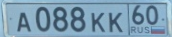

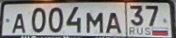

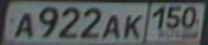

In [5]:
plates_root = "datasets/autoriaNumberplateOcrRu-2021-09-01/train/img"
plates = os.listdir(plates_root)

for i in range(3):
    plate = plates[i]
    plate_path = os.path.join(plates_root, plate)
    img = Image.open(plate_path)
    display(img)

Для лучшей работы модели применим различные методы аугментации данных, например, возьмём следующие преобразования:

* Искажение перспективы
* Аффинные преобразования
* Наложение шума
* Гауссово размытие

Посмотрим, как каждое из преобразований повлияет на изображение

## Искажение перспективы

In [6]:
def get_image_corners(image):
    h, w = image.shape[:2]
    return np.array([[0, 0], [w, 0], [w, h], [0, h]], dtype=np.float32)

In [7]:
def perspective_distortion(image, old_corners = None, strength=0.1):
    """Искажение перспективы с автоматическим определением углов"""
    h, w = image.shape[:2]
    
    if old_corners is None:
        src_corners = get_image_corners(image)
    else:
        src_corners = old_corners
    
    # Генерируем случайные смещения для углов
    offset = int(strength * min(h, w))
    dst_corners = src_corners.copy()
    dst_corners += np.random.randint(-offset, offset+1, size=(4, 2))
    
    # Матрица перспективного преобразования
    M = cv2.getPerspectiveTransform(src_corners, dst_corners)
    
    # Преобразуем углы, чтобы найти новый размер
    corners_homog = np.hstack([src_corners, np.ones((4,1))]).T  # 3x4
    transformed_corners = M @ corners_homog  # 3x4
    transformed_corners /= transformed_corners[2,:]
    xs = transformed_corners[0,:]
    ys = transformed_corners[1,:]
    
    min_x, max_x = np.min(xs), np.max(xs)
    min_y, max_y = np.min(ys), np.max(ys)
    
    new_w = int(np.ceil(max_x - min_x))
    new_h = int(np.ceil(max_y - min_y))
    
    # Сдвиг матрицы, чтобы положить изображение в положительные координаты
    translation = np.array([
        [1, 0, -min_x],
        [0, 1, -min_y],
        [0, 0, 1]
    ])
    M_translated = translation @ M
    
    # Применяем warpPerspective с новым размером
    warped_image = cv2.warpPerspective(image, M_translated, (new_w, new_h), borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0, 0))
    
    # Вычисляем новые координаты углов (после сдвига)
    new_corners = []
    for i in range(4):
        pt = np.array([src_corners[i,0], src_corners[i,1], 1])
        transformed_pt = M_translated @ pt
        new_corners.append([transformed_pt[0]/transformed_pt[2], transformed_pt[1]/transformed_pt[2]])
    
    return warped_image, np.array(new_corners)

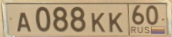

Old coords:  [[  0.   0.]
 [172.   0.]
 [172.  37.]
 [  0.  37.]]


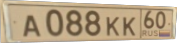

New coords:  [[  0.   0.]
 [177.   7.]
 [175.  39.]
 [  1.  43.]]


In [8]:
plate = plates[0]
plate_path = os.path.join(plates_root, plate)

img = cv2.imread(plate_path, cv2.IMREAD_UNCHANGED)

img_, new_coords  = perspective_distortion(img, strength=0.2)

pil_img = Image.fromarray(img)
pil_img_ = Image.fromarray(img_)
display(pil_img)
print("Old coords: ", get_image_corners(img))
display(pil_img_)
print("New coords: ", new_coords)

## Аффинные преобразования

In [9]:
def affine_transform(image, old_corners=None, rotate=1, scale=0.1, shear=5):
    """Аффинные преобразования с автоматическим расчетом углов"""
    h, w = image.shape[:2]
    if old_corners is None:
        src_corners = get_image_corners(image)
    else:
        src_corners = old_corners
    
    # Параметры преобразования
    angle = np.random.uniform(-rotate, rotate)
    scale = 1 + np.random.uniform(-scale, scale)
    shear_x = np.random.uniform(-shear, shear)
    shear_y = np.random.uniform(-shear, shear)
    
    # Получаем матрицу поворота + масштабирования
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, scale)
    # Добавляем сдвиг (shear) в матрицу
    M[0,2] += shear_x
    M[1,2] += shear_y
    
    # Преобразуем углы
    corners = np.hstack([src_corners, np.ones((4,1))]).T  # 3x4
    transformed_corners = M @ corners  # 2x4
    
    xs = transformed_corners[0,:]
    ys = transformed_corners[1,:]
    
    min_x, max_x = np.min(xs), np.max(xs)
    min_y, max_y = np.min(ys), np.max(ys)
    
    new_w = int(np.ceil(max_x - min_x))
    new_h = int(np.ceil(max_y - min_y))
    
    # Сдвигаем матрицу, чтобы новое изображение поместилось в положительные координаты
    M[0,2] += -min_x
    M[1,2] += -min_y
    
    # Применяем warpAffine с новым размером
    transformed_image = cv2.warpAffine(image, M, (new_w, new_h), borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0, 0))
    
    # Новые координаты углов
    new_corners = []
    for i in range(4):
        new_corners.append([transformed_corners[0,i] - min_x, transformed_corners[1,i] - min_y])
    
    return transformed_image, np.array(new_corners)

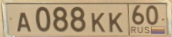

Old coords:  [[  0.   0.]
 [172.   0.]
 [172.  37.]
 [  0.  37.]]


New coords:  [[  0.39075885   0.        ]
 [118.26305295   1.81650059]
 [117.8722941   27.1727499 ]
 [  0.          25.35624931]]
(28, 119, 4)


In [10]:
img_, new_coords  = affine_transform(img, scale=0.6, shear=0.06)

pil_img = Image.fromarray(img)
pil_img_ = Image.fromarray(img_)
display(pil_img)
print("Old coords: ", get_image_corners(img))
display(pil_img_)
print("New coords: ", new_coords)
print(img_.shape)

## Добавление шума

In [11]:
def add_noise(image, old_corners=None, intensity=0.05):
    """Добавление шума (углы не меняются)"""
    if old_corners is None:
        src_corners = get_image_corners(image)
    else:
        src_corners = old_corners
    noise = np.random.normal(0, intensity*255, image.shape)
    noisy_image = image.astype(np.float32) + noise
    return cv2.convertScaleAbs(noisy_image), src_corners

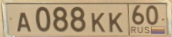

Old coords:  [[  0.   0.]
 [172.   0.]
 [172.  37.]
 [  0.  37.]]


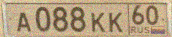

New coords:  [[  0.   0.]
 [172.   0.]
 [172.  37.]
 [  0.  37.]]


In [12]:
img_, new_coords  = add_noise(img, intensity=0.05)

pil_img = Image.fromarray(img)
pil_img_ = Image.fromarray(img_)
display(pil_img)
print("Old coords: ", get_image_corners(img))
display(pil_img_)
print("New coords: ", new_coords)

## Гауссово размытие

In [13]:
def gaussian_blur(image, old_corners=None, max_kernel=5):
    """Гауссово размытие (углы не меняются)"""
    if old_corners is None:
        src_corners = get_image_corners(image)
    else:
        src_corners = old_corners
    kernel_size = 2 * np.random.randint(0, max_kernel//2) + 1
    return cv2.GaussianBlur(image, (kernel_size, kernel_size), 0), src_corners

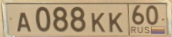

Old coords:  [[  0.   0.]
 [172.   0.]
 [172.  37.]
 [  0.  37.]]


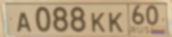

New coords:  [[  0.   0.]
 [172.   0.]
 [172.  37.]
 [  0.  37.]]


In [14]:
img_, new_coords  = gaussian_blur(img, max_kernel=10)

pil_img = Image.fromarray(img)
pil_img_ = Image.fromarray(img_)
display(pil_img)
print("Old coords: ", get_image_corners(img))
display(pil_img_)
print("New coords: ", new_coords)

Будем использовать эти преобразования для аугментации данных. Теперь нужно наложить изображения на другой датасет. Посмотрим на следующие данные, которые можно скачать после регистрации через корпоративную почту университета

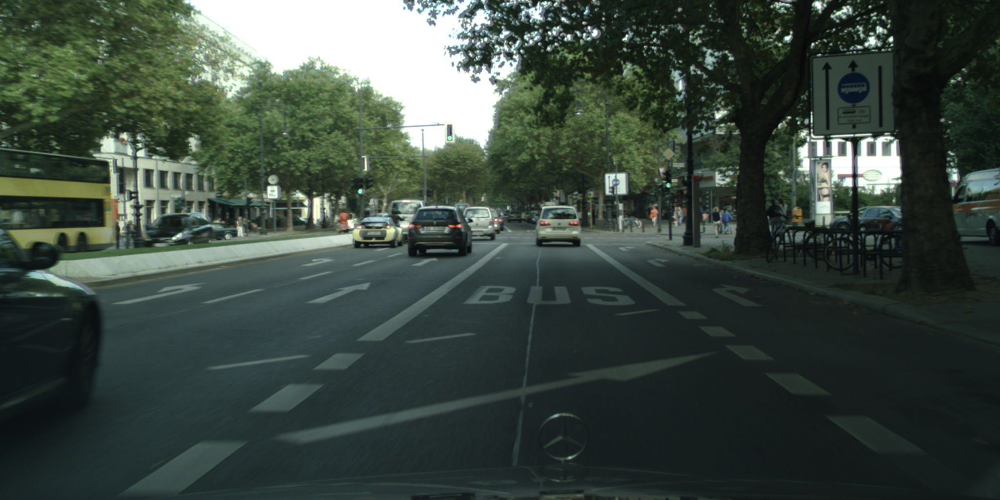

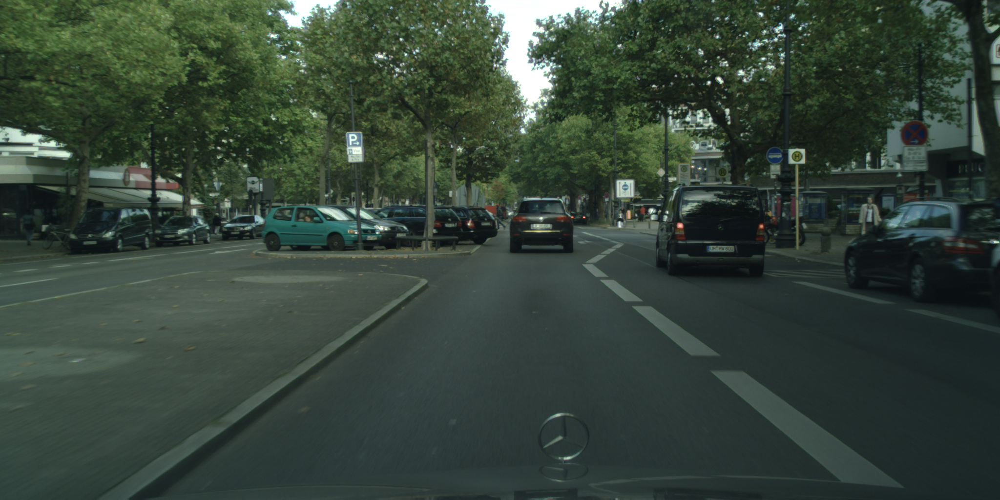

In [15]:
backgrounds_path = "datasets/leftImg8bit/test/berlin"

backgrounds = os.listdir(backgrounds_path)

for i in range(2):
    background = backgrounds[i]
    background_path = os.path.join(backgrounds_path, background)
    img = Image.open(background_path)
    display(img)

Будем накладывать наши номера на подобные изображения

При наложении у нас будут резко меняться края, поэтому сгладим их немного

На цвета нам всё равно, так что сразу будем сохранять ч/б изображения

In [16]:
def overlay_image_alpha(background, overlay, old_corners=None):
    """
    Накладывает overlay на background в позиции (x, y) с учётом альфа-канала,
    сглаживая края для избежания резких переходов.
    """
    # Размеры наложения
    h, w = overlay.shape[:2]
    if old_corners is None:
        src_corners = get_image_corners(overlay)
    else:
        src_corners = old_corners
    # Разделяем каналы
    if overlay.shape[2] == 4:
        overlay_img = overlay[..., :3]
        overlay_mask = overlay[..., 3:] / 255.0
    else:
        overlay_img = overlay
        # Создаем маску из непрозрачных пикселей (все 1)
        overlay_mask = np.ones((h, w, 1), dtype=np.float32)

    # Размываем маску для плавных краёв
    overlay_mask = cv2.GaussianBlur(overlay_mask, (9,9), 0)

    # Область на фоне, куда накладываем
    h_b, w_b = background.shape[:2]
    y = np.random.randint(int(h_b * 0.1), int(h_b * 0.9))
    x = np.random.randint(int(w_b * 0.1), int(w_b * 0.9))
    roi = background[y:y+h, x:x+w]

    # Альфа-смешивание
    overlay_mask = overlay_mask[..., np.newaxis]
    blended = roi * (1 - overlay_mask) + overlay_img * overlay_mask

    background[y:y+h, x:x+w] = blended.astype(np.uint8)
    background = cv2.cvtColor(background, cv2.COLOR_BGR2GRAY)

    new_corners = []
    
    for corner in src_corners:
        new_corner = corner
        new_corner[0] += x
        new_corner[1] += y
        new_corners.append(new_corner)
    new_corners = np.array(new_corners, dtype=np.float32)
    return background, new_corners

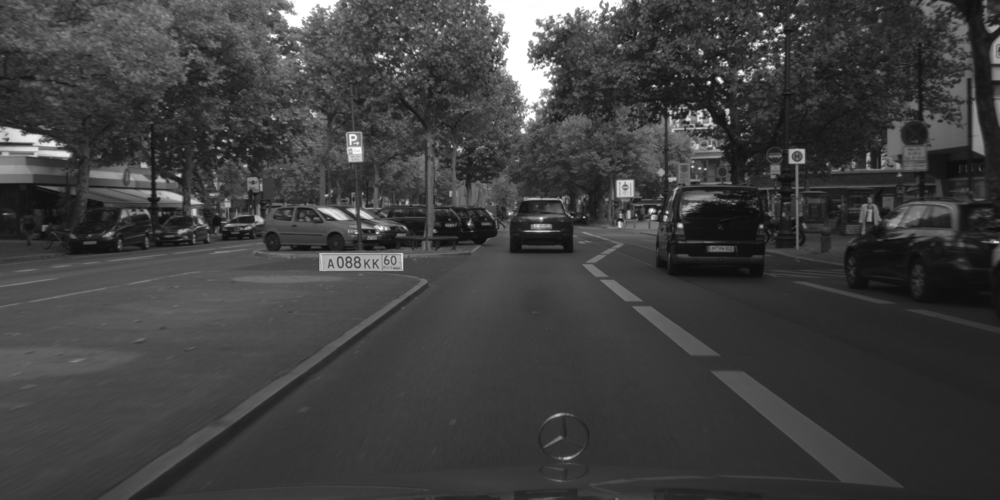

[[654. 518.]
 [826. 518.]
 [826. 555.]
 [654. 555.]]


In [17]:
plate = cv2.imread(plate_path, cv2.IMREAD_UNCHANGED)
background = cv2.imread(background_path, cv2.IMREAD_UNCHANGED)
result, new_corners = overlay_image_alpha(background, plate)

res = Image.fromarray(result)
display(res)
print(new_corners)

Теперь внедрим процесс добавления искажений, пусть они добавляются случайным образом и на одно изображение может наложиться сразу несколько искажений

In [18]:
def distort_image(image, old_corners=None):
    """Постепенное искажение изображения"""
    if old_corners is None:
        corners = get_image_corners(image)
    else:
        corners = old_corners
        
    p = np.random.random()
    if p <= 0.4:
        image, corners = perspective_distortion(image, corners, strength=0.2)
    p = np.random.random()
    if p <= 0.4:
        image, corners = affine_transform(image, corners, scale=0.9)
    p = np.random.random()
    if p <= 0.4:
        image, corners = add_noise(image, corners)
    p = np.random.random()
    if p <= 0.4:
        image, corners = gaussian_blur(image, corners)
        
    return image, corners

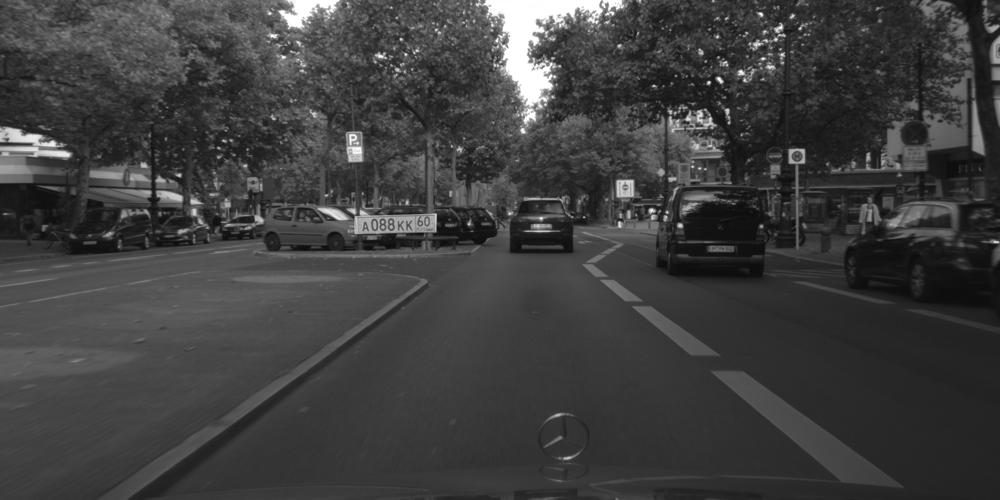

[[726. 437.]
 [895. 437.]
 [895. 481.]
 [726. 481.]]


In [19]:
plate = plates[0]
plate_path = os.path.join(plates_root, plate)
plate = cv2.imread(plate_path, cv2.IMREAD_UNCHANGED)
plate, corners = distort_image(plate)
background = cv2.imread(background_path, cv2.IMREAD_UNCHANGED)
result, new_corners = overlay_image_alpha(background, plate)

res = Image.fromarray(result)
display(res)
print(new_corners)

Теперь напишем окончательную функцию, которая будет выбирать случайные номерные знаки и помещать их на случайное изображение

In [20]:
import random

In [ ]:
def get_plates(ds_type):
    root = os.path.join("datasets/autoriaNumberplateOcrRu-2021-09-01", ds_type, "img")
    imgs = os.listdir(root)
    mean = 5
    std = 2
    sample = np.random.normal(loc=mean, scale=std)
    integer = int(np.round(sample))
    num = np.clip(integer, 1, 10)
    
    random_plates = random.sample(imgs, num)
    
    plates = []
    
    for r_plt in random_plates:
        plate = cv2.imread(os.path.join(root, r_plt), cv2.IMREAD_UNCHANGED)
        plate = cv2.cvtColor(plate, cv2.COLOR_BGR2BGRA)
        plates.append(plate)
    return plates
    
def get_background(ds_type):
    root = os.path.join("datasets/leftImg8bit", ds_type)
    cities = os.listdir(root)
    city = random.sample(cities, 1)[0]
    backgrounds = os.listdir(os.path.join(root, city))
    background_path = random.sample(backgrounds, 1)[0]
    background = cv2.imread(os.path.join(root, city, background_path), cv2.IMREAD_UNCHANGED)
    background = cv2.cvtColor(background, cv2.COLOR_BGR2BGRA)
    return background

def overlay_image_alpha(img, img_overlay, x, y, alpha_mask):
    """Overlay `img_overlay` onto `img` at (x, y) and blend using `alpha_mask`.

    `alpha_mask` must have same HxW as `img_overlay` and values in range [0, 1].
    """
    # Image ranges
    y1, y2 = max(0, y), min(img.shape[0], y + img_overlay.shape[0])
    x1, x2 = max(0, x), min(img.shape[1], x + img_overlay.shape[1])

    # Overlay ranges
    y1o, y2o = max(0, -y), min(img_overlay.shape[0], img.shape[0] - y)
    x1o, x2o = max(0, -x), min(img_overlay.shape[1], img.shape[1] - x)

    # Exit if nothing to do
    if y1 >= y2 or x1 >= x2 or y1o >= y2o or x1o >= x2o:
        return

    # Blend overlay within the determined ranges
    img_crop = img[y1:y2, x1:x2]
    img_overlay_crop = img_overlay[y1o:y2o, x1o:x2o]
    alpha = alpha_mask[y1o:y2o, x1o:x2o, np.newaxis]
    alpha_inv = 1.0 - alpha

    img_crop[:] = alpha * img_overlay_crop + alpha_inv * img_crop
    img[y1:y2, x1:x2] = img_crop
    return img


def plate_on_background(background, overlay, old_corners=None, ROI = None, max_attemps = 10):
    """
    Накладывает overlay на background в позиции (x, y) с учётом альфа-канала,
    сглаживая края для избежания резких переходов.
    """
    # Размеры наложения
    h, w = overlay.shape[:2]
    if old_corners is None:
        src_corners = get_image_corners(overlay)
    else:
        src_corners = old_corners
        
    alpha_mask = overlay[:, :, 3] / 255.0
    img_result = background[:,:,:3].copy()
    img_overlay = overlay[:,:,:3]
    
    # Область на фоне, куда накладываем
    h_b, w_b = background.shape[:2]

    if ROI is None:
        ROI = np.zeros((h_b, w_b), dtype=np.uint8)
    
    for _ in range(max_attemps):
        x = np.random.randint(int(w_b * 0.1), int(w_b * 0.9))
        y = np.random.randint(int(h_b * 0.1), int(h_b * 0.9))
        if np.sum(ROI[y:y+h, x:x+w]) > 0 or (x + w >= w_b or y + h >= h_b):
            continue
        
        background = overlay_image_alpha(img_result, img_overlay, x, y, alpha_mask)
        ROI[y:y+h, x:x+w] = 1
        
            
        new_corners = []
        
        for corner in src_corners:
            new_corner = corner
            new_corner[0] += x
            new_corner[1] += y
            new_corners.append(new_corner)
        new_corners = np.array(new_corners, dtype=np.float32)
        return background, new_corners, ROI
    
    return background, None, ROI

def normalize_label(label, height, width):
    for i in range(len(label)):
        # label[i][0] /=
        pass
    
def save_labels(labels, height, width, ds_type, output):
    pass
    

def generate_sample(ds_type="train"):
    plates = get_plates(ds_type)
    background = get_background(ds_type)
    
    ROI = None
    label_corners = []
    
    for plate in plates:
        distorted_plate, corners = distort_image(plate)
        
        background, new_corners, ROI = plate_on_background(background, distorted_plate,corners, ROI)
        if new_corners is not None:
            label_corners.append(new_corners)
            
    background = cv2.cvtColor(background, cv2.COLOR_BGR2GRAY)
    
    
    return plates, background




GET PLATES
(82, 379, 4)
(36, 168, 4)
(84, 387, 4)
(49, 227, 4)
(64, 296, 4)
(70, 322, 4)
(39, 181, 4)
GET BACKGROUND
(1024, 2048, 4)


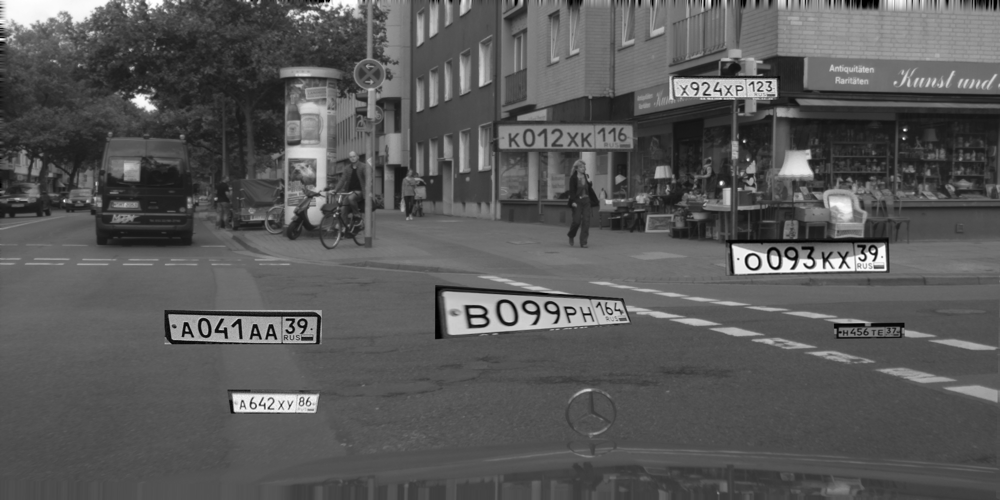

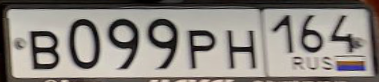

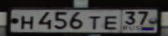

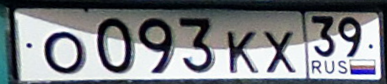

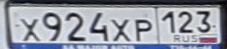

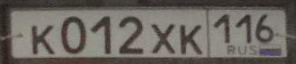

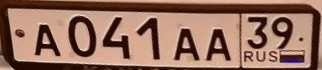

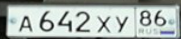

In [ ]:
plates, background = generate_sample()

img = Image.fromarray(background)
display(img)